In [42]:
import pandas as pd
SG_Dataset = pd.read_excel('EnvNP_SG_Facebook.xlsx')
SG_Dataset

,Unnamed: 0,Name of organisation,Description of organisation,Mission/ Objectives/ Purpose,Programmes/ projects,Funding sources,Collaboration with government / businesses,Choice of Climate action,No. of employees,Geographical focus,...,PostIDs,Comments,Content,Post_URL,Images,Date,Reactions,Reaction_Count,Shares,video
0,0,Nature Society Singapore (NSS),The Nature Society (Singapore) or NSS is a non...,- Organise nature appreciation activities like...,"- guided nature walks, bird and butterfly watc...","Run by volunteers, the Society depends financi...",Yes - businesses,Advocacy/ Mitigation,43,"Singapore, Singapore",...,pfbid09WCGd7tYeo7P7Xc5p9YGWoNwsMvhMWLwnPouPnPt...,7.0,"Dr Chan Kin Onn, the former curator of herpeto...",https://www.facebook.com/naturesocietysingapor...,['https://external-xsp1-1.xx.fbcdn.net/emg1/v/...,2024-03-26T14:48:21.688783,"{'likes': 7, 'loves': 1, 'wow': 0, 'cares': 0,...",8.0,0.0,[]
1,0,Nature Society Singapore (NSS),The Nature Society (Singapore) or NSS is a non...,- Organise nature appreciation activities like...,"- guided nature walks, bird and butterfly watc...","Run by volunteers, the Society depends financi...",Yes - businesses,Advocacy/ Mitigation,43,"Singapore, Singapore",...,pfbid02v7vjGso56ie5bQGdvdbJVMM5Pc18bRFPzMxLYXv...,4.0,wildlife photography tips from Jayaprakash Boj...,https://www.facebook.com/naturesocietysingapor...,['https://external-xsp1-1.xx.fbcdn.net/emg1/v/...,2024-03-26T12:48:27.974982,"{'likes': 15, 'loves': 0, 'wow': 0, 'cares': 0...",15.0,0.0,[]
2,0,Nature Society Singapore (NSS),The Nature Society (Singapore) or NSS is a non...,- Organise nature appreciation activities like...,"- guided nature walks, bird and butterfly watc...","Run by volunteers, the Society depends financi...",Yes - businesses,Advocacy/ Mitigation,43,"Singapore, Singapore",...,pfbid02FwUTacg4PSXTG7LiZ3HSEmCKFjt6ddFRV4q3v8p...,0.0,flashback:a talk on the predecessor of Nature ...,https://www.facebook.com/naturesocietysingapor...,['https://external-xsp1-1.xx.fbcdn.net/emg1/v/...,2024-03-25T12:48:28.006620,"{'likes': 7, 'loves': 0, 'wow': 0, 'cares': 0,...",7.0,0.0,[]
3,0,Nature Society Singapore (NSS),The Nature Society (Singapore) or NSS is a non...,- Organise nature appreciation activities like...,"- guided nature walks, bird and butterfly watc...","Run by volunteers, the Society depends financi...",Yes - businesses,Advocacy/ Mitigation,43,"Singapore, Singapore",...,pfbid02A81piNYTixYdt6AU4qoExPiubqUixQPwPycX7GQ...,4.0,more on the Woodlands Checkpoint expansion …,https://www.facebook.com/naturesocietysingapor...,['https://external-xsp1-1.xx.fbcdn.net/emg1/v/...,2024-03-23T12:48:28.062741,"{'likes': 2, 'loves': 0, 'wow': 0, 'cares': 0,...",3.0,0.0,[]
4,0,Nature Society Singapore (NSS),The Nature Society (Singapore) or NSS is a non...,- Organise nature appreciation activities like...,"- guided nature walks, bird and butterfly watc...","Run by volunteers, the Society depends financi...",Yes - businesses,Advocacy/ Mitigation,43,"Singapore, Singapore",...,pfbid0AdHRLg587zELE4RTszkNyFokKXu93bf8fSTicitJ...,3.0,a good perspective of a whole body of a fungi ...,https://www.facebook.com/naturesocietysingapor...,['https://scontent-xsp1-2.xx.fbcdn.net/v/t39.3...,2024-03-23T12:48:28.113328,"{'likes': 19, 'loves': 0, 'wow': 1, 'cares': 0...",20.0,3.0,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1801,41,Earthlink NTU,"Since 1993, Earthlink has led NTU’s environmen...",Raise awareness of environmental issues,- Guided tours\n- NTU Biodiversity Week\n- NTr...,NaN,Yes - businesses,Mitigation/ Advocacy,NaN,Singapore,...,pfbid0324p6AuFLtRDzwKLa4GuQw7adWvS65kctLdKz9GC...,3.0,Earthlink NTU’s Welcome Tea 2018 will be happe...,https://www.facebook.com/earthlinkntu/posts/pf...,['https://scontent-xsp2-1.xx.fbcdn.net/v/t1.64...,2018-08-15T00:00:00,"{'likes': 4, 'loves': 0, 'wow': 0, 'cares': 0,...",4.0,0.0,[]
1802,41,Earthlink NTU,"Since 1993, Earthlink has led NTU’s environmen...",Rais

In [43]:
SG_Dataset.dropna(subset=['Content'], inplace=True)
df = SG_Dataset[['Facebook_User','Content']]
df.head(10)

,Facebook_User,Content
0,naturesocietysingapore,"Dr Chan Kin Onn, the former curator of herpeto..."
1,naturesocietysingapore,wildlife photography tips from Jayaprakash Boj...
2,naturesocietysingapore,flashback:a talk on the predecessor of Nature ...
3,naturesocietysingapore,more on the Woodlands Checkpoint expansion …
4,naturesocietysingapore,a good perspective of a whole body of a fungi ...
5,naturesocietysingapore,it's the International Day of Forests ..painti...
6,naturesocietysingapore,Call for Volunteers!!!Have an interest in natu...
7,naturesocietysingapore,it's World Frog Day ...
8,naturesocietysingapore,All of these will provide insights into how th...
9,naturesocietysingapore,an aerial perspective of the planned reclamati...


In [44]:
!pip3 install pandas nltk gensim


In [45]:
!pip3 install nltk

In [46]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
import re

# Download necessary NLTK data
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Load your DataFrame (example)
# df = pd.read_csv('your_dataframe.csv')

# Define the preprocessing function
def preprocess_text(text):
    # Tokenize and lowercase
    tokens = word_tokenize(text.lower())
    
    # Remove special characters and numbers
    tokens = [re.sub(r'[^a-zA-Z\s]', '', token) for token in tokens]
    
    # Initialize the lemmatizer and stopwords list
    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    #special stop word removal for this dataset 
    
    # Lemmatize and remove stopwords and tokens that became empty after cleaning
    clean_tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stop_words and token != '']
    
    return " ".join(clean_tokens)

# Apply preprocessing to the 'Content' column
df['Cleaned_Content'] = df['Content'].apply(preprocess_text)

# Display the first few rows of the dataframe to verify changes
display(df.head())


[nltk_data] Downloading package punkt to /Users/yuvvvvv/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/yuvvvvv/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/yuvvvvv/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
/var/folders/k4/5t9w_3t17bx_h1kzys3r8tvh0000gn/T/ipykernel_2671/109336917.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Cleaned_Content'] = df['Content'].apply(preprocess_text)


,Facebook_User,Content,Cleaned_Content
0,naturesocietysingapore,"Dr Chan Kin Onn, the former curator of herpeto...",dr chan kin onn former curator herpetology stu...
1,naturesocietysingapore,wildlife photography tips from Jayaprakash Boj...,wildlife photography tip jayaprakash bojan jay...
2,naturesocietysingapore,flashback:a talk on the predecessor of Nature ...,flashback talk predecessor nature society sing...
3,naturesocietysingapore,more on the Woodlands Checkpoint expansion …,woodland checkpoint expansion
4,naturesocietysingapore,a good perspective of a whole body of a fungi ...,good perspective whole body fungi


In [8]:
#dictionary creation: mapping each word to a unique id
import gensim
dictionary = gensim.corpora.Dictionary(df['Cleaned_Content'].apply(str.split))
count = 0
id_topic_dictionary = {}
for k, v in dictionary.iteritems():
    #print(k, v)
    id_topic_dictionary[k] = v

#13,126 unique words: goal is to identify environmental problems and solutions being worked on.
dictionary_df = pd.DataFrame(list(id_topic_dictionary.items()), columns = ['id', 'title_combined'])
display(dictionary_df)

,id,title_combined
0,0,amphibian
1,1,animal
2,2,anotherhttps
3,3,bioacoustics
4,4,biologist
...,...,...
13122,13122,acappella
13123,13123,cac
13124,13124,handicraft
13125,13125,hao


In [9]:
dictionary_df.drop(columns=['id'], inplace=True)
dictionary_df

,title_combined
0,amphibian
1,animal
2,anotherhttps
3,bioacoustics
4,biologist
...,...
13122,acappella
13123,cac
13124,handicraft
13125,hao


In [13]:
from sklearn.model_selection import train_test_split

df = pd.read_csv("training_climate_data.csv")

X = df["title_combined"]
y = df["topic"]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [17]:
df

,title,topic,title_combined
0,Rethinking Solutionism: Why We Need More Aware...,1,rethink/Rethinking solution/Solutionism need/N...
1,Why I Willingly Gave A Third Party Remote Acce...,1,willingli/Willingly gave/Gave third/Third part...
2,The Colorado River Basin Is Disappearing Into ...,1,colorado/Colorado river/River basin/Basin disa...
3,Why Toniic members invested in Fervo Energy’s ...,1,toniic/Toniic member/Members invest/Invested f...
4,Are Christian Values At Odds With Climate Chan...,1,christian/Christian valu/Values odd/Odds clima...
...,...,...,...
954,Common Questions About TSA Approved Luggage Locks,0,common/Common question/Questions tsa/Tsa appro...
955,Aer Day Sling 3: A Review,0,aer/Aer day/Day sling/Sling review/Review
956,Aer Tech Pack Review,0,aer/Aer tech/Tech pack/Pack review/Review
957,Choosing the Perfect Travel Gear for Your Next...,0,choos/Choosing perfect/Perfect travel/Travel g...


In [14]:
from bs4 import BeautifulSoup
from urllib.request import urlopen
import urllib
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split 
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
import ssl
import re
from nltk.stem import PorterStemmer, WordNetLemmatizer 
from sklearn.feature_extraction.text import TfidfVectorizer 
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer 
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier,AdaBoostClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression 
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_predict

In [29]:
from imblearn.over_sampling import SMOTE

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
# Create a pipeline for feature engineering

pipeline = Pipeline([
    ('vectorizer', CountVectorizer()),
    ('tfidf_transformer', TfidfTransformer()),
])

# Fit the pipeline on the training data and transform it
X_train_transformed = pipeline.fit_transform(X_train) # Transform the validation data
X_val_transformed = pipeline.transform(X_val)


# Define base models
rf_classifier = RandomForestClassifier()
bagging_classifier = BaggingClassifier()
ada_classifier = AdaBoostClassifier()
mlp_classifier = MLPClassifier()

# Create the stacking classifier
base_models = [('rf', rf_classifier), ('bagging', bagging_classifier), ('ada', ada_classifier), ('mlp', mlp_classifier)]
meta_model = LogisticRegression()
stacking_classifier = StackingClassifier(estimators=base_models, final_estimator=meta_model)

# Create an instance of the oversampler
smote = SMOTE(random_state=42)

# Oversample the training data
X_train_oversampled, y_train_oversampled = smote.fit_resample(X_train_transformed, y_train)

#run cross validation on the training set to test for overfitting
from sklearn.model_selection import cross_val_score
scores = cross_val_score(stacking_classifier, X_train_oversampled, y_train_oversampled, cv=10)
print("Cross-validation scores: ", scores)

# Fit the stacking classifier on the oversampled training data
best_stacking_classifier = stacking_classifier.fit(X_train_oversampled, y_train_oversampled)

# Make predictions on the validation data
y_pred_encoded = best_stacking_classifier.predict(X_val_transformed)


# Print classification report
print(classification_report(y_pred_encoded, y_val))

/opt/homebrew/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/homebre

Cross-validation scores:  [0.8375     0.8125     0.7875     0.6875     0.8        0.85
 0.8125     0.8375     0.82278481 0.86075949]


/opt/homebrew/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/homebre

              precision    recall  f1-score   support

           0       0.82      0.90      0.86        96
           1       0.89      0.80      0.84        96

    accuracy                           0.85       192
   macro avg       0.85      0.85      0.85       192
weighted avg       0.85      0.85      0.85       192



In [32]:
increment = 3282
iterations = len(dictionary_df) // increment + 1
y_preds = []
for iteration in range(iterations):
    X_val_transform = pipeline.transform(dictionary_df['title_combined'][iteration*increment:(iteration+1)*increment])
    y_pred = best_stacking_classifier.predict(X_val_transform)
    y_preds.extend(y_pred)

predicted_df = pd.DataFrame({'title': dictionary_df['title_combined'], 'topic': y_preds})
predicted_df

,title,topic
0,amphibian,0
1,animal,0
2,anotherhttps,0
3,bioacoustics,0
4,biologist,0
...,...,...
13122,acappella,0
13123,cac,0
13124,handicraft,0
13125,hao,0


In [39]:
predicted_df = predicted_df[predicted_df['topic'] == 1]

In [40]:
dictionary = gensim.corpora.Dictionary(predicted_df['title'].apply(str.split))
for k, v in dictionary.iteritems():
    print(k, v)
    

0 history
1 important
2 natural
3 tool
4 wildlife
5 talk
6 expansion
7 perspective
8 feature
9 forest
10 network
11 plant
12 river
13 tree
14 way
15 world
16 call
17 code
18 conservation
19 corridor
20 march
21 north
22 play
23 saturday
24 something
25 want
26 insight
27 biodiversity
28 bird
29 ecologically
30 habitat
31 impact
32 low
33 marsh
34 threatened
35 tide
36 area
37 coastal
38 endangered
39 environmental
40 land
41 major
42 report
43 little
44 survival
45 even
46 contribute
47 develop
48 education
49 future
50 generation
51 intern
52 leader
53 let
54 next
55 project
56 ready
57 word
58 book
59 garden
60 decline
61 due
62 facility
63 factor
64 green
65 housing
66 industrial
67 landscape
68 loss
69 road
70 back
71 sea
72 unveiling
73 water
74 china
75 threat
76 data
77 importance
78 condition
79 last
80 proposal
81 save
82 created
83 environment
84 near
85 ecological
86 community
87 marine
88 plan
89 east
90 would
91 accurate
92 extinction
93 oldest
94 paint
95 record
96 countr

In [82]:
dictionary_df

,title_combined
0,amphibian
1,animal
2,anotherhttps
3,bioacoustics
4,biologist
...,...
13122,acappella
13123,cac
13124,handicraft
13125,hao


In [104]:
# import google.generativeai as genai


# genai.configure(api_key=GOOGLE_API_KEY)
# model = genai.GenerativeModel('gemini-pro')
# predicted_vals = []
# for word in dictionary_df['title_combined']:
#     currentWord = word
#     prompt = f'I am going to parse through a dataframe, and I am going to give you a word for each row in that dataframe. You have to identify if that word could be an interesting topic related to climate action or not. Output 1 if it is related to climate action and 0 if it is not. Note some of the words can be lemmatized. Here is you current word: {currentWord}'
#     response = model.generate_content(prompt)   
#     output = response.text
#     predicted_vals.append(output)   



ResourceExhausted: 429 Quota exceeded for quota metric 'Generate Content API requests per minute' and limit 'GenerateContent request limit per minute for a region' of service 'generativelanguage.googleapis.com' for consumer 'project_number:739421121219'. [reason: "RATE_LIMIT_EXCEEDED"
domain: "googleapis.com"
metadata {
  key: "service"
  value: "generativelanguage.googleapis.com"
}
metadata {
  key: "quota_metric"
  value: "generativelanguage.googleapis.com/generate_content_requests"
}
metadata {
  key: "quota_location"
  value: "us-west4"
}
metadata {
  key: "quota_limit"
  value: "GenerateContentRequestsPerMinutePerProjectPerRegion"
}
metadata {
  key: "quota_limit_value"
  value: "60"
}
metadata {
  key: "consumer"
  value: "projects/739421121219"
}
, links {
  description: "Request a higher quota limit."
  url: "https://cloud.google.com/docs/quota#requesting_higher_quota"
}
]

In [47]:
bow_corpus = [dictionary.doc2bow(doc) for doc in df['Cleaned_Content'].apply(str.split)]


In [17]:
bow_corpus

[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 2),
  (27, 1),
  (28, 1)],
 [(29, 1),
  (30, 1),
  (31, 1),
  (32, 2),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1)],
 [(38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1)],
 [(44, 1), (45, 1), (46, 1)],
 [(47, 1), (48, 1), (49, 1), (50, 1), (51, 1)],
 [(10, 1),
  (20, 1),
  (41, 2),
  (51, 1),
  (52, 1),
  (53, 2),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 1),
  (67, 3),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 3),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 1),
  (83, 1),
  (84, 1),
  (85, 1),
  (86, 1),
  (87, 1),
  (88, 1),
  (8

In [48]:
bow_doc_4310 = bow_corpus[100] #
for i in range(len(bow_doc_4310)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_4310[i][0],
                                               dictionary[bow_doc_4310[i][0]],
bow_doc_4310[i][1]))

Word 49 ("future") appears 1 time.
Word 53 ("let") appears 1 time.
Word 64 ("green") appears 2 time.
Word 70 ("back") appears 1 time.
Word 81 ("save") appears 1 time.
Word 88 ("plan") appears 2 time.
Word 147 ("greener") appears 1 time.
Word 149 ("sustainable") appears 1 time.
Word 184 ("work") appears 1 time.
Word 194 ("promoting") appears 1 time.
Word 241 ("resource") appears 1 time.
Word 255 ("waste") appears 3 time.
Word 280 ("infrastructure") appears 1 time.
Word 281 ("living") appears 1 time.
Word 282 ("series") appears 1 time.
Word 284 ("towards") appears 1 time.


In [49]:
import gensim
from gensim.models import CoherenceModel
from gensim.models import LdaModel
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
import numpy as np
import nltk.stem as stemmer
np.random.seed(2018)
import pandas as pd
import numpy as np
import re
import gensim
from gensim.utils import simple_preprocess
import nltk
from matplotlib import pyplot as plt
from nltk.corpus import stopwords

In [50]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=1):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, passes = 10, iterations = 100)
        model_list.append(model)
        coherence_model = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherence_model.get_coherence())

    return model_list, coherence_values

In [51]:
start_topics = 15
limit_topics = 70 #experiment with these factors to attain the highest coherence scores
step_size = 1
num_topics = list(range(start_topics,limit_topics + 1, step_size))

model_list, coherence_values = compute_coherence_values(dictionary=dictionary, corpus=bow_corpus, texts=df['Cleaned_Content'].apply(str.split), start=start_topics, limit=limit_topics, step=step_size)

print(model_list)
print(coherence_values)
# Plotting coherence values
x = range(start_topics, limit_topics, step_size)
plt.plot(x, coherence_values)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence score")
plt.title("Coherence Scores vs. Number of Topics")
plt.show()
optimal_num_topics = num_topics[coherence_values.index(max(coherence_values))]
print(f"Optimal number of topics: {optimal_num_topics}")

KeyboardInterrupt: 

In [52]:
import random
total_avail_topics = len(dictionary)
lda_model_total =  gensim.models.LdaMulticore(bow_corpus, num_topics=total_avail_topics, id2word=dictionary, passes=10, workers=1)
total_topics = lda_model_total.show_topics(formatted=False, num_topics=total_avail_topics)


In [53]:
df = df.sort_values(by=['Facebook_User'])
df = df.reset_index(drop=True)
df

,Facebook_User,Content,Cleaned_Content
0,ACRESasia,CROAKSTAR GETS A SECOND CHANCE IN THE WILD: At...,croakstar get second chance wild wildlife resc...
1,ACRESasia,CNY OPEN HOUSE: CELEBRATE WITH ACRES!As the ma...,cny open house celebrate acre majestic dragon ...
2,ACRESasia,DRAGONS OF ACRES Happy 4th day of the Chinese ...,dragon acre happy th day chinese new year cele...
3,ACRESasia,"LOVE IS EVERYWHERE - in the air, sometimes on ...",love everywhere air sometimes ground rain sun ...
4,ACRESasia,RESERVE 18 MAY 2024 FOR ACRES GALA: WILD SECON...,reserve may acre gala wild second chance meet ...
...,...,...,...
1713,zerowastesg,Navigate a Sustainable Lunar New Year: Logist...,navigate sustainable lunar new year logistics ...
1714,zerowastesg,Embracing Responsibility this Chinese New Yea...,embracing responsibility chinese new year exte...
1715,zerowastesg,Munch Mindfully this Chinese New Year: Sustai...,munch mindfully chinese new year sustainable s...
1716,zerowastesg,Welcome to the Spring Cleaning Sustainability...,welcome spring cleaning sustainability guide l...


In [54]:
#goal is to create a new dataframe where we get 41 topics per organisation

mapped_topics = {}
countries = ['SG']
optimal_num_topics = 41
def generated_df(df_specific_bow_corpus, organisation_name):
    lda_model =  gensim.models.LdaMulticore(df_specific_bow_corpus, num_topics=optimal_num_topics, id2word=dictionary, passes=15, workers=4)
    topics = lda_model.show_topics(formatted=False, num_topics=optimal_num_topics)
    main_df = pd.DataFrame()
    for topic in topics:
        words = [word for word in topic[1]] 
        Topic_Word = [dictionary[topic[0]] for word, value in topic[1]]  
        word_values = [value for word, value in topic[1]] 
        topics_df = pd.DataFrame({'Topic': Topic_Word, 'Word': words, 'Value': word_values})
        topics_df['Organisation'] = organisation_name   
        main_df = pd.concat([main_df, topics_df])
    return main_df

def feed_dfs(df):
    main_df = pd.DataFrame()
    for organisation in list(df['Facebook_User'].unique()):
        unique_org_df = df[df['Facebook_User'] == organisation]
        df_specific_bow_corpus = [dictionary.doc2bow(doc) for doc in unique_org_df['Cleaned_Content'].apply(str.split)]
        generated_dataframe = generated_df(df_specific_bow_corpus, organisation)
        mapped_topics[organisation] = generated_dataframe
        main_df = pd.concat([main_df, generated_dataframe])
    return main_df



for country in countries:
    df_country = pd.read_excel(f"EnvNP_{country}_Facebook.xlsx")
    df_country.dropna(subset=['Content'], inplace=True)
    df_country = df_country[['Facebook_User','Content']]
    df_country['Cleaned_Content'] = df_country['Content'].apply(preprocess_text)
    country_specific_topic_dataset = feed_dfs(df_country)
    country_specific_topic_dataset['Country'] = country
    country_specific_topic_dataset.to_excel(f"{country}_Topic_Dataset.xlsx") #save the country specific topic datasets to excel files

print("Topic datasets created")
#filtering out values below a certain threshold and then calculating topic scores -> to mitigate impact of noise on topic importance selection

Topic datasets created


## Topic Analysis
### Goals: To add more stopwording to remove topics without much meaning and words without much meaning
### Focus: The topic modeller to capture trends in climate action policies

In [55]:
import pandas as pd
topic_dataset = pd.read_excel('SG_Topic_Dataset.xlsx')
topic_dataset

,Unnamed: 0,Topic,Word,Value,Organisation,Country
0,0,history,"('cultivating', 0.0013106159)",0.001311,naturesocietysingapore,SG
1,1,history,"('shining', 0.0013106159)",0.001311,naturesocietysingapore,SG
2,2,history,"('storage', 0.0013106159)",0.001311,naturesocietysingapore,SG
3,3,history,"('brand', 0.0013106159)",0.001311,naturesocietysingapore,SG
4,4,history,"('getting', 0.0013106159)",0.001311,naturesocietysingapore,SG
...,...,...,...,...,...,...
14755,5,land,"('getting', 0.03141349)",0.031413,earthlinkntu,SG
14756,6,land,"('use', 0.03141349)",0.031413,earthlinkntu,SG
14757,7,land,"('footprint', 0.03141349)",0.031413,earthlinkntu,SG
14758,8,land,"('enough', 0.03141349)",0.031413,earthlinkntu,SG


In [56]:
#for each organisation and each topic i want to get the lower and upper quartiles
from pprint import pprint
import numpy as np
def get_iq_for_topic_in_organisation(topic):
    topic_df = topic_dataset[topic_dataset['Topic'] == topic]
    topic_values = [value for value in topic_df['Value']]
    lower_quartile = np.percentile(topic_values, 25)
    upper_quartile = np.percentile(topic_values, 75)
    return lower_quartile, upper_quartile

def get_iq_for_all_topics_in_organisation(topic_data):
    topics = list(topic_data['Topic'].unique())
    topic_iq = {}
    for topic in topics:
        lower_quartile, upper_quartile = get_iq_for_topic_in_organisation(topic)
        topic_iq[topic] = (lower_quartile, upper_quartile)
    return topic_iq

topic_iqs = get_iq_for_all_topics_in_organisation(topic_dataset)
pprint(topic_iqs)

{'area': (0.001310615916736424, 0.03532814607024193),
 'biodiversity': (0.001310615916736424, 0.03459622338414192),
 'bird': (0.001310615916736424, 0.03345862403512001),
 'call': (0.001310510560870171, 0.03710230067372322),
 'coastal': (0.001310615916736424, 0.03580548614263535),
 'code': (0.001310615916736424, 0.0314134918153286),
 'conservation': (0.001310615916736424, 0.03710231930017471),
 'corridor': (0.001310615916736424, 0.0374486418440938),
 'ecologically': (0.001310615916736424, 0.03849660791456699),
 'endangered': (0.001310615916736424, 0.03710231930017471),
 'environmental': (0.001310615916736424, 0.031413484364748),
 'expansion': (0.001310615916736424, 0.02959430031478405),
 'feature': (0.001310615916736424, 0.03047948516905308),
 'forest': (0.001310615916736424, 0.02876701205968857),
 'habitat': (0.001310615916736424, 0.03710230067372322),
 'history': (0.001310615916736424, 0.02461887523531914),
 'impact': (0.001310615916736424, 0.03459622338414192),
 'important': (0.00131

In [57]:
# given the topic_iqs, how can i map it into my topic_dataset dataframe and create Q1 and Q3 columns
def map_iq_to_topic(topic_data, topic_iqs):
    topic_data['Q1'] = topic_data['Topic'].map(lambda x: topic_iqs[x][0])
    topic_data['Q3'] = topic_data['Topic'].map(lambda x: topic_iqs[x][1])
    return topic_data

topic_dataset = map_iq_to_topic(topic_dataset, topic_iqs)
topic_dataset

,Unnamed: 0,Topic,Word,Value,Organisation,Country,Q1,Q3
0,0,history,"('cultivating', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619
1,1,history,"('shining', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619
2,2,history,"('storage', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619
3,3,history,"('brand', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619
4,4,history,"('getting', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619
...,...,...,...,...,...,...,...,...
14755,5,land,"('getting', 0.03141349)",0.031413,earthlinkntu,SG,0.001311,0.031413
14756,6,land,"('use', 0.03141349)",0.031413,earthlinkntu,SG,0.001311,0.031413
14757,7,land,"('footprint', 0.03141349)",0.031413,earthlinkntu,SG,0.001311,0.031413
14758,8,land,"('enough', 0.03141349)",0.031413,earthlinkntu,SG,0.001311,0.031413


In [58]:
import ast

topic_dataset['Filtered_Values'] = topic_dataset.apply(lambda row: row['Value'] if (row['Value'] >= row['Q1']) else np.NaN, axis=1)
topic_dataset

,Unnamed: 0,Topic,Word,Value,Organisation,Country,Q1,Q3,Filtered_Values
0,0,history,"('cultivating', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
1,1,history,"('shining', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
2,2,history,"('storage', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
3,3,history,"('brand', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
4,4,history,"('getting', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
...,...,...,...,...,...,...,...,...,...
14755,5,land,"('getting', 0.03141349)",0.031413,earthlinkntu,SG,0.001311,0.031413,0.031413
14756,6,land,"('use', 0.03141349)",0.031413,earthlinkntu,SG,0.001311,0.031413,0.031413
14757,7,land,"('footprint', 0.03141349)",0.031413,earthlinkntu,SG,0.001311,0.031413,0.031413
14758,8,land,"('enough', 0.03141349)",0.031413,earthlinkntu,SG,0.001311,0.031413,0.031413


In [59]:
topic_dataset.tail(20)

,Unnamed: 0,Topic,Word,Value,Organisation,Country,Q1,Q3,Filtered_Values
14740,0,environmental,"('partner', 0.04162519)",0.041625,earthlinkntu,SG,0.001311,0.031413,0.041625
14741,1,environmental,"('student', 0.04162519)",0.041625,earthlinkntu,SG,0.001311,0.031413,0.041625
14742,2,environmental,"('simple', 0.04162519)",0.041625,earthlinkntu,SG,0.001311,0.031413,0.041625
14743,3,environmental,"('present', 0.04162519)",0.041625,earthlinkntu,SG,0.001311,0.031413,0.041625
14744,4,environmental,"('want', 0.04162519)",0.041625,earthlinkntu,SG,0.001311,0.031413,0.041625
14745,5,environmental,"('collect', 0.04162519)",0.041625,earthlinkntu,SG,0.001311,0.031413,0.041625
14746,6,environmental,"('nurturing', 0.0009910816)",0.000991,earthlinkntu,SG,0.001311,0.031413,NaN
14747,7,environmental,"('plot', 0.0009910816)",0.000991,earthlinkntu,SG,0.001311,0.031413,NaN
14748,8,environmental,"('rachel', 0.0009910816)",0.000991,earthlinkntu,SG,0.001311,0.031413,NaN
14749,9,environmental,"('storage', 0.0009910816)",0.000991,earthlinkntu,SG,0.001311,0.031413,NaN


In [60]:
topic_dataset.isna().sum()

Unnamed: 0            0
Topic                 0
Word                  0
Value                 0
Organisation          0
Country               0
Q1                    0
Q3                    0
Filtered_Values    1927
dtype: int64

In [61]:
topic_dataset_filtered = topic_dataset.dropna(subset=['Filtered_Values'])
topic_dataset_filtered.head(50)

,Unnamed: 0,Topic,Word,Value,Organisation,Country,Q1,Q3,Filtered_Values
0,0,history,"('cultivating', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
1,1,history,"('shining', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
2,2,history,"('storage', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
3,3,history,"('brand', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
4,4,history,"('getting', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
5,5,history,"('nurturing', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
6,6,history,"('son', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
7,7,history,"('plot', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
8,8,history,"('examining', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311
9,9,history,"('rachel', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311


In [62]:
topic_scores = topic_dataset_filtered.groupby('Topic')['Value'].mean()

In [63]:
dict_topic_scores= topic_scores.to_dict()

def get_topic_score(row):
    row['Topic_Score'] = dict_topic_scores[row['Topic']]
    return row

topic_dataset_filtered = topic_dataset_filtered.apply(get_topic_score, axis=1)
topic_dataset_filtered.head(20)

,Unnamed: 0,Topic,Word,Value,Organisation,Country,Q1,Q3,Filtered_Values,Topic_Score
0,0,history,"('cultivating', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
1,1,history,"('shining', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
2,2,history,"('storage', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
3,3,history,"('brand', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
4,4,history,"('getting', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
5,5,history,"('nurturing', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
6,6,history,"('son', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
7,7,history,"('plot', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
8,8,history,"('examining', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
9,9,history,"('rachel', 0.0013106159)",0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844


In [64]:
topic_dataset_filtered['Topic'].unique()

array(['history', 'important', 'natural', 'tool', 'wildlife', 'talk',
       'expansion', 'perspective', 'feature', 'forest', 'network',
       'plant', 'river', 'tree', 'way', 'world', 'call', 'code',
       'conservation', 'corridor', 'march', 'north', 'play', 'saturday',
       'something', 'want', 'insight', 'biodiversity', 'bird',
       'ecologically', 'habitat', 'impact', 'low', 'marsh', 'threatened',
       'tide', 'area', 'coastal', 'endangered', 'environmental', 'land'],
      dtype=object)

In [260]:
# do a similar topic removal
#lower_topic_quartile = np.quantile(topic_dataset_filtered['Topic_Score'], 0.25)
#lower_upper_quartile = np.quantile(topic_dataset_filtered['Topic_Score'], 0.75)
#print(lower_topic_quartile, lower_upper_quartile)

In [261]:
#topic_dataset_filtered = topic_dataset_filtered.apply(lambda row: row if (row['Topic_Score'] >= lower_topic_quartile) else np.NaN, axis=1)  
#topic_dataset_filtered = topic_dataset_filtered.dropna(subset=['Topic_Score'])
#topic_dataset_filtered

In [262]:
pprint(list(topic_dataset_filtered['Topic'].unique()))  
#interconnected topics in SG
#trying to remove the irrelevant topics

['animal',
 'anotherhttps',
 'bioacoustics',
 'biologist',
 'chan',
 'dr',
 'former',
 'history',
 'important',
 'kin',
 'kong',
 'lee',
 'natural',
 'onn',
 'said',
 'sound',
 'specie',
 'tool',
 'wwwstraitstimescom',
 'bojan',
 'contributor',
 'jayaprakash',
 'n',
 'regular',
 'wildlife',
 'nature',
 'predecessor',
 'amphibian',
 'chian',
 'curator',
 'differentiate',
 'herpetology',
 'museum',
 'one',
 'study',
 'fb',
 'photography',
 'tip',
 'flashback',
 'howlisteningto',
 'reptile']


In [65]:
potentially_important_topics = ['natural', 'wildlife', 'expansion', 'forest', 'conservation', 'biodiversity', 'coastal', 'environmental', 'endangered', 'tide', 'habitat']

In [66]:
#how to check for duplicate rows based on a column
topic_dataset_filtered['Word'] = topic_dataset_filtered['Word'].apply(lambda x: ast.literal_eval(x)[0])
topic_dataset_filtered


,Unnamed: 0,Topic,Word,Value,Organisation,Country,Q1,Q3,Filtered_Values,Topic_Score
0,0,history,cultivating,0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
1,1,history,shining,0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
2,2,history,storage,0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
3,3,history,brand,0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
4,4,history,getting,0.001311,naturesocietysingapore,SG,0.001311,0.024619,0.001311,0.015844
...,...,...,...,...,...,...,...,...,...,...
14755,5,land,getting,0.031413,earthlinkntu,SG,0.001311,0.031413,0.031413,0.019328
14756,6,land,use,0.031413,earthlinkntu,SG,0.001311,0.031413,0.031413,0.019328
14757,7,land,footprint,0.031413,earthlinkntu,SG,0.001311,0.031413,0.031413,0.019328
14758,8,land,enough,0.031413,earthlinkntu,SG,0.001311,0.031413,0.031413,0.019328


In [265]:
len(topic_dataset_filtered[topic_dataset_filtered['Topic'] == 'animal'][topic_dataset_filtered['Word'] == 'specie']) #command for word frequency in topic

/var/folders/k4/5t9w_3t17bx_h1kzys3r8tvh0000gn/T/ipykernel_70325/689810726.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  len(topic_dataset_filtered[topic_dataset_filtered['Topic'] == 'animal'][topic_dataset_filtered['Word'] == 'specie']) #command for word frequency in topic


2

In [267]:
def generate_word_frequencies(topic_df_group):
    topic_df_group['Word_Frequency'] = topic_df_group['Word'].map(topic_df_group['Word'].value_counts())
    return topic_df_group


for topic in (list(topic_dataset_filtered['Topic'].unique()) and potentially_important_topics):
    topic_group_df = topic_dataset_filtered[topic_dataset_filtered['Topic'] == topic]
    topic_group_df = generate_word_frequencies(topic_group_df)
    topic_dataset_filtered = pd.concat([topic_dataset_filtered, topic_group_df])

topic_dataset_filtered


/var/folders/k4/5t9w_3t17bx_h1kzys3r8tvh0000gn/T/ipykernel_70325/3038933844.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  topic_df_group['Word_Frequency'] = topic_df_group['Word'].map(topic_df_group['Word'].value_counts())
/var/folders/k4/5t9w_3t17bx_h1kzys3r8tvh0000gn/T/ipykernel_70325/3038933844.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  topic_df_group['Word_Frequency'] = topic_df_group['Word'].map(topic_df_group['Word'].value_counts())
/var/folders/k4/5t9w_3t17bx_h1kzys3r8tvh0000gn/T/ipyke

,Unnamed: 0,Topic,Word,Value,Organisation,Country,Q1,Q3,Filtered_Values,Topic_Score,Word_Frequency
10,0,animal,december,0.006094,naturesocietysingapore,SG,0.000077,0.004862,0.006094,0.003745,NaN
11,1,animal,specie,0.006094,naturesocietysingapore,SG,0.000077,0.004862,0.006094,0.003745,NaN
12,2,animal,migrant,0.003084,naturesocietysingapore,SG,0.000077,0.004862,0.003084,0.003745,NaN
13,3,animal,total,0.003084,naturesocietysingapore,SG,0.000077,0.004862,0.003084,0.003745,NaN
14,4,animal,singapore,0.003084,naturesocietysingapore,SG,0.000077,0.004862,0.003084,0.003745,NaN
...,...,...,...,...,...,...,...,...,...,...,...
14575,5,reptile,part,0.007550,earthlinkntu,SG,0.000076,0.004996,0.007550,0.003858,4.0
14576,6,reptile,join,0.007024,earthlinkntu,SG,0.000076,0.004996,0.007024,0.003858,2.0
14577,7,reptile,international,0.006121,earthlinkntu,SG,0.000076,0.004996,0.006121,0.003858,2.0
14578,8,reptile,http,0.006097,earthlinkntu,SG,0.000076,0.004996,0.006097,0.003858,8.0


In [ ]:
topic_dataset_filtered[topic_dataset_filtered['Topic'] == 'animal']

In [221]:
def get_duplicated_words_per_topic(topic_group):
    if topic_group['Topic'].iloc[0] not in potentially_important_topics: return np.NaN
    return topic_group.duplicated(['Word']).sum()

duplicated_words_per_topic = pd.DataFrame(topic_dataset_filtered.groupby('Topic').apply(get_duplicated_words_per_topic))
duplicated_words_per_topic = duplicated_words_per_topic.dropna()
duplicated_words_per_topic
#shows that there exists word wise linkage between the important topics thus a DAG can be created

/var/folders/k4/5t9w_3t17bx_h1kzys3r8tvh0000gn/T/ipykernel_70325/2129224408.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  duplicated_words_per_topic = pd.DataFrame(topic_dataset_filtered.groupby('Topic').apply(get_duplicated_words_per_topic))


,0
Topic,
animal,39.0
bioacoustics,40.0
biologist,38.0
herpetology,31.0
natural,36.0
nature,39.0
reptile,45.0
sound,45.0
specie,40.0


### Creating a WordCloud to gauge importance/frequency of words within a topic -> help identify solutions/problems and focus areas in topics

In [222]:
!pip3 install wordcloud

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.3/168.3 kB 7.0 MB/s eta 0:00:00


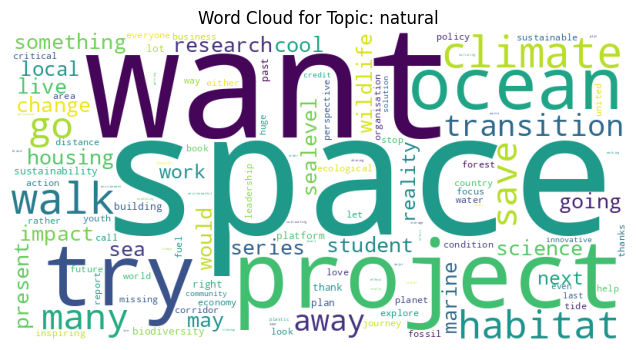

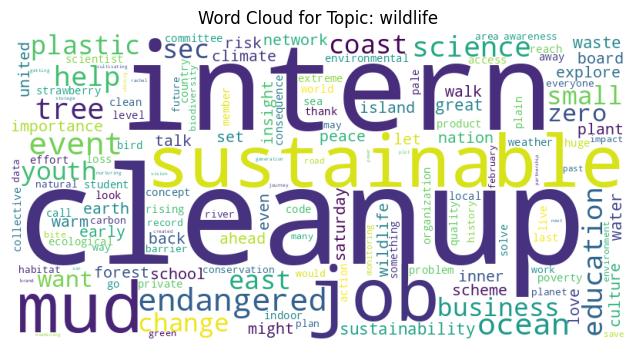

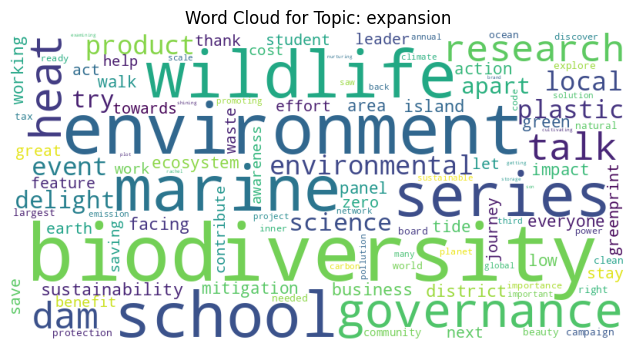

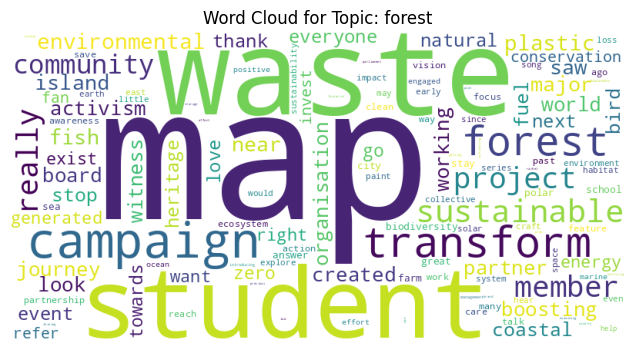

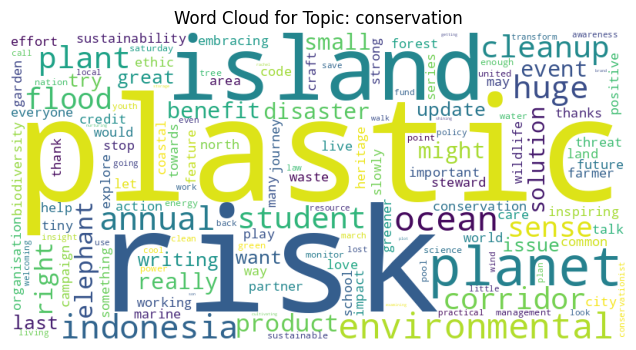

...

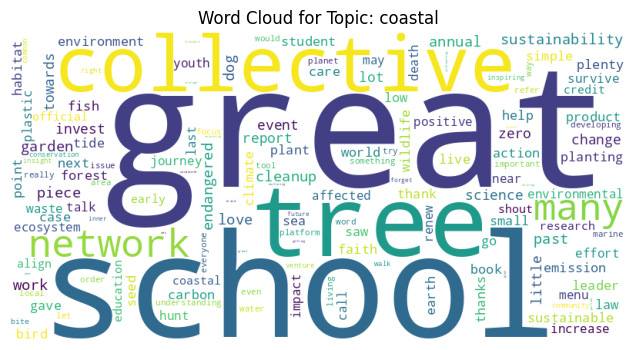

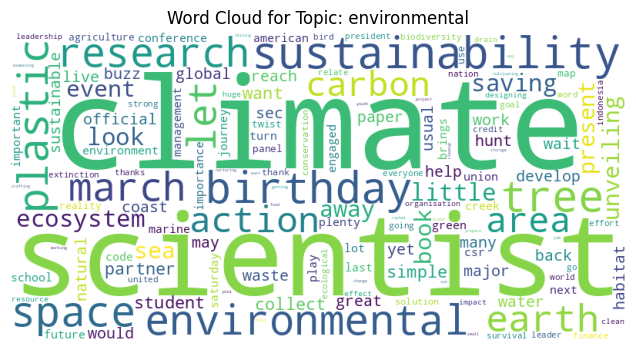

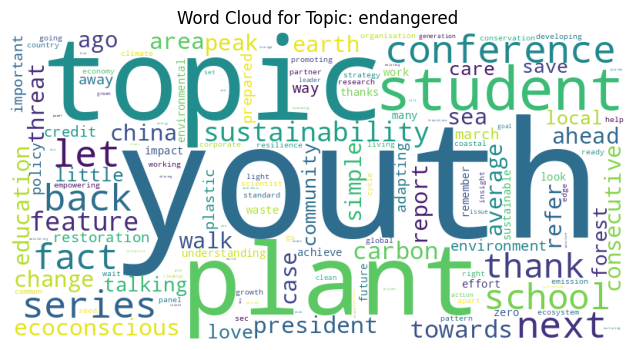

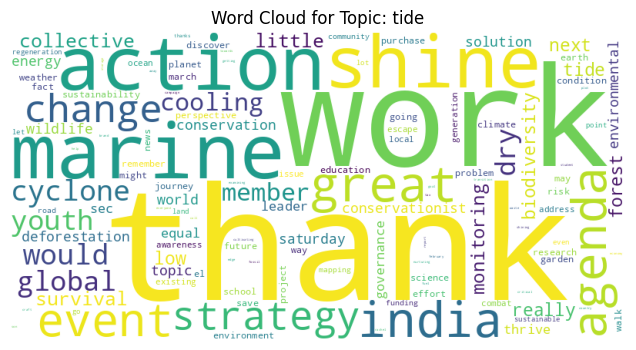

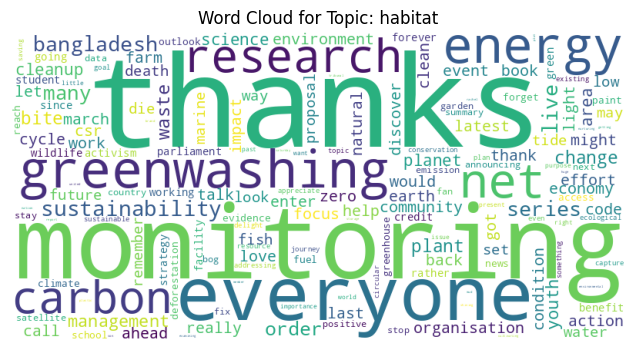

In [67]:
#word cloud plotted by word_importance
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
word_mapping = {}
for topic in (list(topic_dataset_filtered['Topic'].unique()) and potentially_important_topics):
    topic_df = topic_dataset_filtered[topic_dataset_filtered['Topic'] == topic]
    word_importance = {row['Word']: row['Filtered_Values'] for index, row in topic_df.iterrows()}
    wordcloud = WordCloud(width=800, height=400, background_color ='white').generate_from_frequencies(word_importance)
    detected_words = list(wordcloud.words_.keys())
    word_mapping[topic] = detected_words
    plt.figure(figsize=(8, 4))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(f"Word Cloud for Topic: {topic}")
    plt.show()


In [ ]:
#distribution among different topics, UN 17 SDGS sustainability goals
#pick relevant SGDs to climate change and try to find topics and words that are related to them to gain insights into focus areas

In [77]:
topic_dataset_filtered[topic_dataset_filtered['Topic'] == 'tide'].head(20)

,Unnamed: 0,Topic,Word,Value,Organisation,Country,Q1,Q3,Filtered_Values,Topic_Score
350,0,tide,little,0.049704,naturesocietysingapore,SG,0.001311,0.031438,0.049704,0.019366
351,1,tide,survival,0.049704,naturesocietysingapore,SG,0.001311,0.031438,0.049704,0.019366
760,0,tide,effort,0.053928,wwfsg,SG,0.001311,0.031438,0.053928,0.019366
761,1,tide,community,0.040538,wwfsg,SG,0.001311,0.031438,0.040538,0.019366
762,2,tide,march,0.040538,wwfsg,SG,0.001311,0.031438,0.040538,0.019366
763,3,tide,future,0.040534,wwfsg,SG,0.001311,0.031438,0.040534,0.019366
764,4,tide,conservation,0.040534,wwfsg,SG,0.001311,0.031438,0.040534,0.019366
765,5,tide,awareness,0.027134,wwfsg,SG,0.001311,0.031438,0.027134,0.019366
766,6,tide,escape,0.027134,wwfsg,SG,0.001311,0.031438,0.027134,0.019366
767,7,tide,generation,0.027130,wwfsg,SG,0.001311,0.031438,0.027130,0.019366


In [272]:
topic_dataset_filtered.drop(columns=['Unnamed: 0', 'Word_Frequency'], inplace=True)
topic_dataset_filtered

,Topic,Word,Value,Organisation,Country,Q1,Q3,Filtered_Values,Topic_Score
10,animal,december,0.006094,naturesocietysingapore,SG,0.000077,0.004862,0.006094,0.003745
11,animal,specie,0.006094,naturesocietysingapore,SG,0.000077,0.004862,0.006094,0.003745
12,animal,migrant,0.003084,naturesocietysingapore,SG,0.000077,0.004862,0.003084,0.003745
13,animal,total,0.003084,naturesocietysingapore,SG,0.000077,0.004862,0.003084,0.003745
14,animal,singapore,0.003084,naturesocietysingapore,SG,0.000077,0.004862,0.003084,0.003745
...,...,...,...,...,...,...,...,...,...
14575,reptile,part,0.007550,earthlinkntu,SG,0.000076,0.004996,0.007550,0.003858
14576,reptile,join,0.007024,earthlinkntu,SG,0.000076,0.004996,0.007024,0.003858
14577,reptile,international,0.006121,earthlinkntu,SG,0.000076,0.004996,0.006121,0.003858
14578,reptile,http,0.006097,earthlinkntu,SG,0.000076,0.004996,0.006097,0.003858


In [285]:
topic_dataset_filtered.isna().sum()

Topic              0
Word               0
Value              0
Organisation       0
Country            0
Q1                 0
Q3                 0
Filtered_Values    0
Topic_Score        0
dtype: int64

In [228]:
!pip3 install networkx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 11.6 MB/s eta 0:00:00a 0:00:01


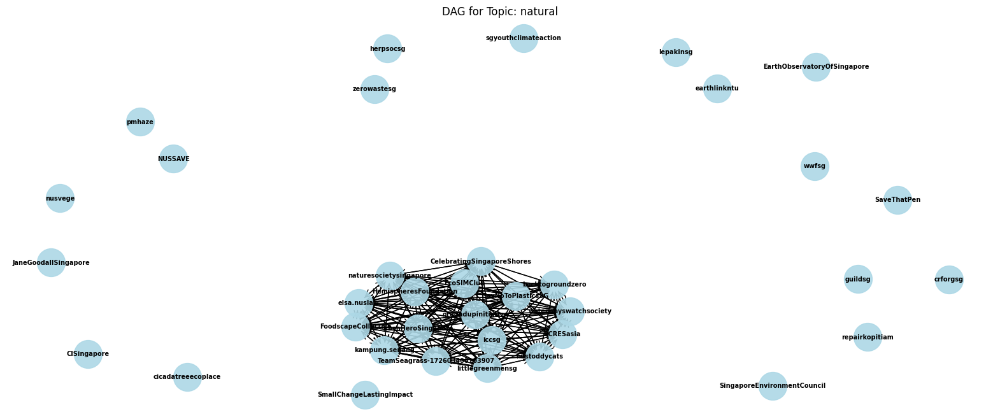

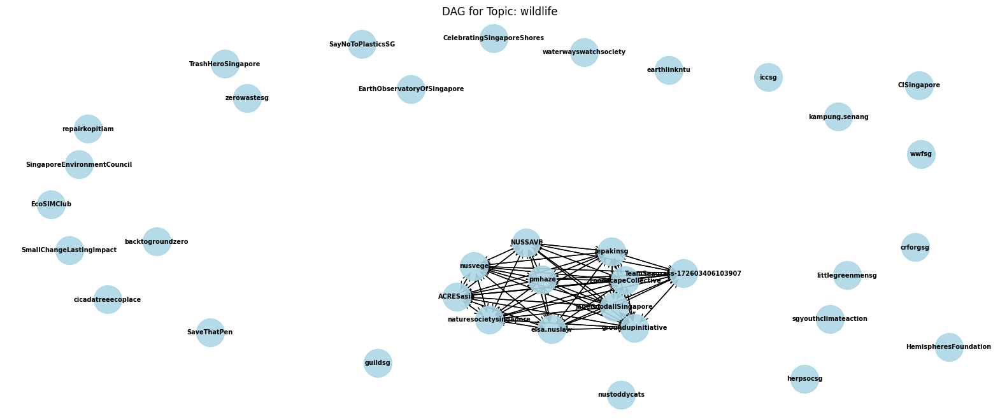

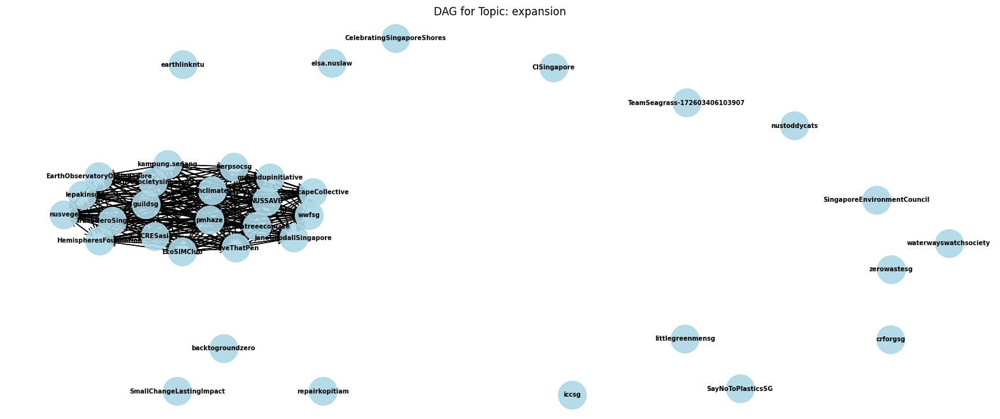

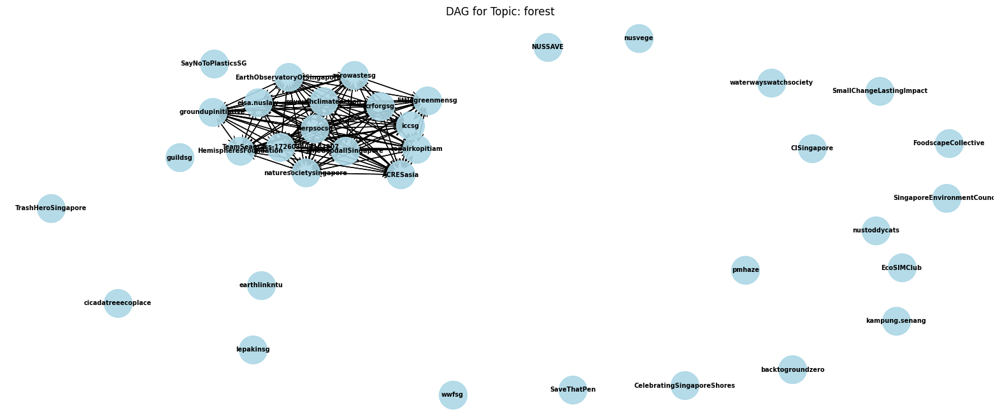

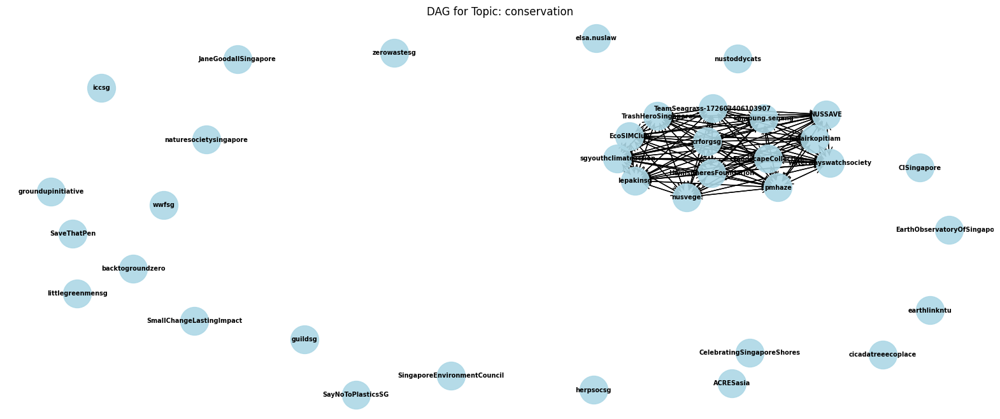

...

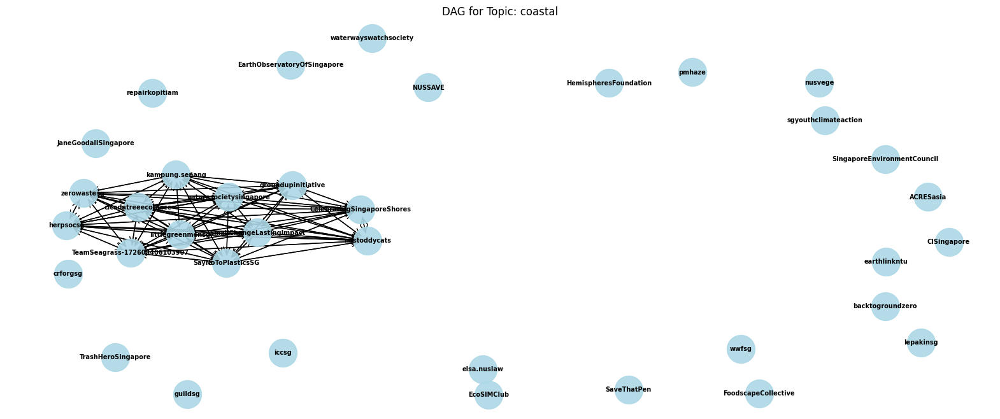

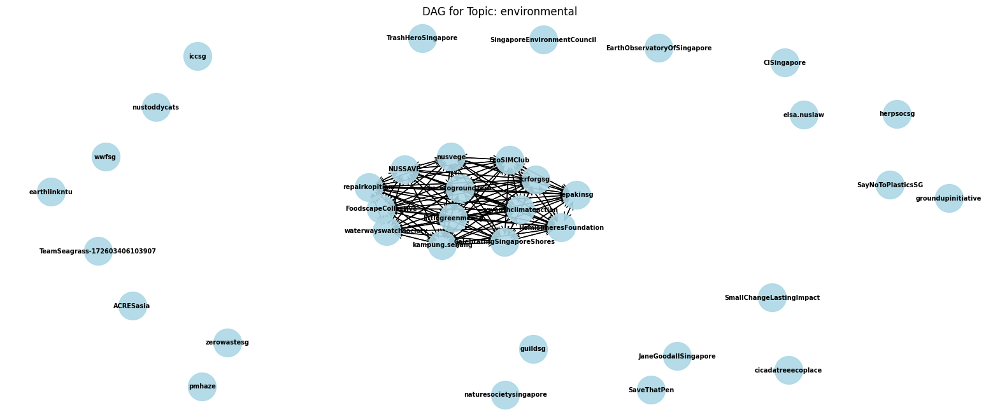

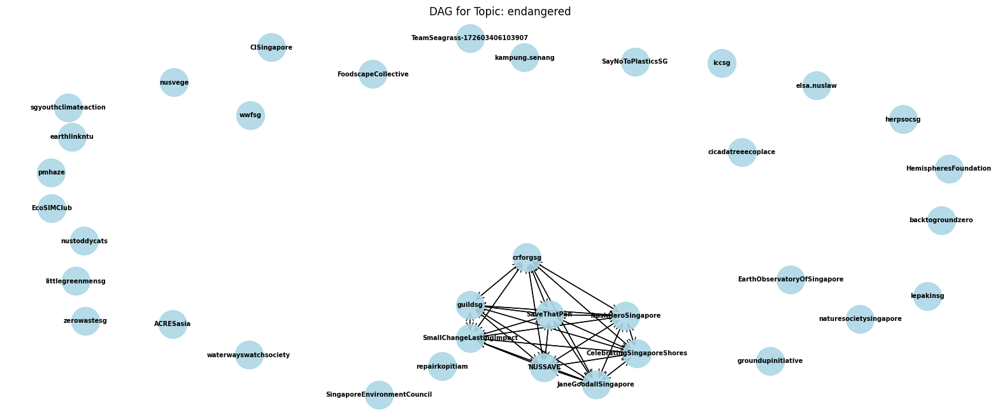

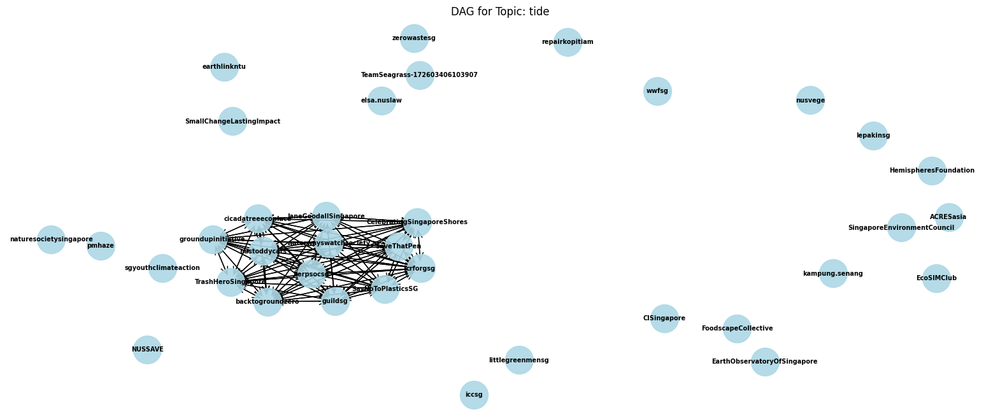

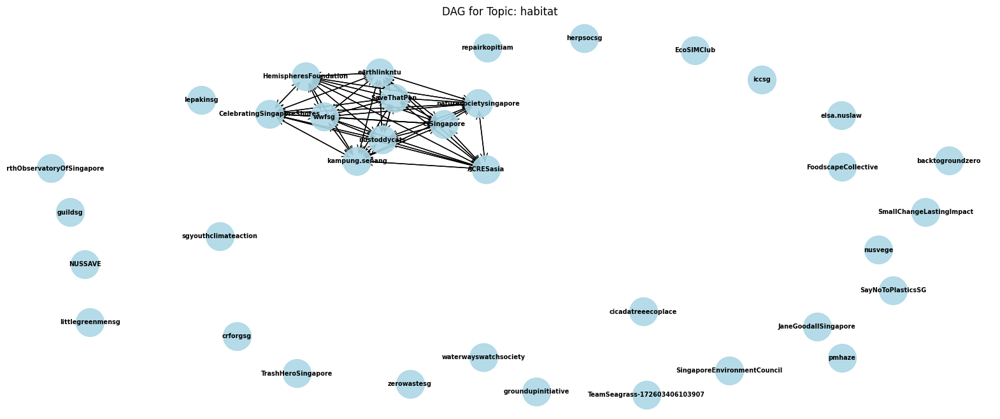

In [76]:
#creatubg a DAG according to the word wise linkage between the important topics
import networkx as nx
graphs = {}

for topic in (list(topic_dataset_filtered['Topic'].unique()) and potentially_important_topics):
    topic_df = topic_dataset_filtered[topic_dataset_filtered['Topic'] == topic]
    G = nx.DiGraph()
    for org in topic_df['Organisation'].unique():
        G.add_node(org)
    for org1 in topic_df['Organisation'].unique():
        for org2 in topic_df['Organisation'].unique():
            if org1 != org2:
                # Find shared words between org1 and org2
                shared_words = set(topic_df[topic_df['Organisation'] == org1]['Word']).intersection(
                    set(topic_df[topic_df['Organisation'] == org2]['Word'])
                )
                # If they share words, add an edge with weight as the count of shared words
                if len(shared_words) >= 5:
                    G.add_edge(org1, org2, weight=1)
    
    graphs[topic] = G



for topic, graph in graphs.items():
    plt.figure(figsize=(20, 8))
    # Using the spring layout: nodes are positioned using Fruchterman-Reingold force-directed algorithm.
    pos = nx.spring_layout(graph, k=.5, iterations=20)  # Adjust k for distance between nodes and iterations for layout precision
    
    # Draw the nodes
    nx.draw_networkx_nodes(graph, pos, node_size=1000, node_color='lightblue', alpha=0.9)
    
    # Draw the edges
    nx.draw_networkx_edges(graph, pos, arrowstyle='->', arrowsize=20, edge_color='black', width=1)
    
    # Label the nodes
    nx.draw_networkx_labels(graph, pos, font_size=7, font_weight='bold')
    
    # Draw edge labels
    #edge_labels = nx.get_edge_attributes(graph, 'weight')
    #nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_labels, label_pos=0.5)
    
    # Set the title of the plot
    plt.title(f'DAG for Topic: {topic}')
    plt.axis('off')  # Turn off the axis
    plt.show()




In [ ]:
#DAGs can be used to gauge shared interests between organisations as it can be clearly seen that
#visible clusters are formed between organisations that share common interests in the topics

## Network Metrics Interpretation of Organisations with Shared Topics

### 1. Degree Centrality
The **degree centrality** of a node represents the fraction of nodes it is directly connected to. Higher values indicate nodes with many connections, suggesting importance or influence within the network.

### 2. Betweenness Centrality
**Betweenness centrality** measures a node's presence on the shortest paths between other nodes. Nodes scoring high in this metric often have considerable control over the network's information flow, acting as critical links between other nodes.

### 3. Closeness Centrality
This metric indicates how close a node is to all other nodes in the network. Nodes with high **closeness centrality** can efficiently interact with others, highlighting their capacity for quick dissemination of information.

### 4. Eigenvector Centrality
**Eigenvector centrality** assigns relative scores to all nodes based on the principle that connections to high-scoring nodes contribute more to the score than connections to low-scoring nodes. It identifies nodes with influence over the network, considering the quality of their connections.

### 5. Density
The **density** of a network indicates how complete the graph is, with 1 being a complete graph where all possible edges are present. A higher density means a closely connected network, whereas a lower density points to a sparse network.

### 6. Communities
**Communities** are identified through clustering algorithms and categorize nodes into groups where nodes are more densely connected internally. Community detection is useful for uncovering structure and clusters within the network.

### 7. Clustering Coefficient
The **clustering coefficient** measures the likelihood that nodes in a network will cluster together. A high average value suggests the presence of tight-knit groups with dense interconnections.

### 8. Connected Components
For undirected graphs, **connected components** are subsets of nodes with a path between every pair of nodes within the subset. In directed networks, components can be strongly or weakly connected. Identifying these components helps understand network structure and isolated subnetworks.

---

Understanding these metrics requires context. For example, in social networks, nodes with high degree and eigenvector centrality might be influencers. In contrast, in an organizational context, such nodes could represent central or coordinating organizations.


In [280]:
!pip3 install community

355902.70s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.3/101.3 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.2/133.2 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.8/226.8 kB 10.9 MB/s eta 0:00:00
  Created wheel for community: filename=community-1.0.0b1-py3-none-any.whl size=2136 sha256=159fe058f5a1049783eef529c6eca3388681504c50196f9fc380d52472b651b4
  Stored in directory: /Users/yuvvvvv/Library/Caches/pip/wheels/b7/c9/3f/e222b011e31d3d1de1fd799caed228f770d56f66563014285d
Successfully built community


In [282]:
!pip3 install python-louvain

355938.15s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.6/204.6 kB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for python-louvain: filename=python_louvain-0.16-py3-none-any.whl size=9389 sha256=ff2566e86a350efe8697b3d87cf737a80c8b022fd87df79904cf9e577663659d
  Stored in directory: /Users/yuvvvvv/Library/Caches/pip/wheels/11/c1/e7/f62a211c636275e2da798bf0c307a3ae79aeddaf2524a03ce4
Successfully built python-louvain


In [78]:
import networkx as nx

# Assuming your 'graphs' dictionary is already populated with DiGraphs for each topic

for topic, graph in graphs.items():
    # Calculate various centrality measures
    degree_centrality = nx.degree_centrality(graph)
    betweenness_centrality = nx.betweenness_centrality(graph)
    closeness_centrality = nx.closeness_centrality(graph)
    eigenvector_centrality = nx.eigenvector_centrality_numpy(graph)

    # Calculate density
    density = nx.density(graph)
    
    # Identify communities (This example uses the Louvain method)
    # You might need to install 'python-louvain' or 'community' package for this
    from community import community_louvain
    undirected_graph = graph.to_undirected()

    communities = community_louvain.best_partition(undirected_graph)

    # Calculate clustering coefficient
    clustering_coefficient = nx.average_clustering(undirected_graph)

    # Find connected components
    connected_components = nx.connected_components(graph.to_undirected())  # Convert to undirected graph for this measure

    # Output the computed metrics
    print(f"Network Analysis Metrics for Topic: {topic}")
    print(f"Degree Centrality: {degree_centrality}")
    print(f"Betweenness Centrality: {betweenness_centrality}")
    print(f"Closeness Centrality: {closeness_centrality}")
    print(f"Eigenvector Centrality: {eigenvector_centrality}")
    print(f"Density: {density}")
    print(f"Communities: {communities}")
    print(f"Clustering Coefficient: {clustering_coefficient}")
    print(f"Connected Components: {list(connected_components)}")
    print("\n")


Network Analysis Metrics for Topic: natural
Degree Centrality: {'naturesocietysingapore': 0.9142857142857143, 'wwfsg': 0.0, 'zerowastesg': 0.0, 'pmhaze': 0.0, 'crforgsg': 0.0, 'groundupinitiative': 0.9142857142857143, 'CISingapore': 0.0, 'sgyouthclimateaction': 0.0, 'waterwayswatchsociety': 0.9142857142857143, 'SingaporeEnvironmentCouncil': 0.0, 'SayNoToPlasticsSG': 0.9142857142857143, 'repairkopitiam': 0.0, 'FoodscapeCollective': 0.9142857142857143, 'lepakinsg': 0.0, 'cicadatreeecoplace': 0.0, 'EarthObservatoryOfSingapore': 0.0, 'HemispheresFoundation': 0.9142857142857143, 'JaneGoodallSingapore': 0.0, 'kampung.senang': 0.9142857142857143, 'backtogroundzero': 0.9142857142857143, 'guildsg': 0.0, 'TrashHeroSingapore': 0.9142857142857143, 'SmallChangeLastingImpact': 0.0, 'iccsg': 0.9142857142857143, 'nustoddycats': 0.9142857142857143, 'TeamSeagrass-172603406103907': 0.9142857142857143, 'herpsocsg': 0.0, 'CelebratingSingaporeShores': 0.9142857142857143, 'SaveThatPen': 0.0, 'ACRESasia': 0.9

### Hierarchial Clustering based on Associated Words

- The hierarchial clustering uses cosine similarity to identify groups of organisations that could be characterised together, with a ward linkage criterion to merge similar groups into clusters. 
- A dendrogram is then drawn to visualise the common clusters

## Insights from the Dendrogram

### Overview
The provided dendrogram visualizes the results of a hierarchical clustering analysis, representing the similarity between different organizations based on associated words within their topics.

### Interpretation of the Dendrogram
- **Clusters Identification**: Organizations that join at the lower points of the dendrogram are more similar to each other in terms of their associated words. For example, `[Org A]` and `[Org B]` cluster together at a low point, indicating a strong similarity.
- **Dissimilarity Between Clusters**: The height of the branches that join two clusters represents their dissimilarity. A higher join point, such as the one between `[Cluster X]` and `[Cluster Y]`, suggests less similarity.
- **Natural Groupings**: There appear to be natural groupings within the dataset. For instance, the grouping of `[Org C, Org D, Org E]` forms a distinct cluster separate from `[Org F, Org G]`.
- **Isolated Organizations**: Some organizations, such as `[Org H]`, do not cluster closely with others, suggesting unique characteristics or focus areas within their word associations.

### Insights Drawn
- **Potential Collaborations**: Organizations within the same cluster may benefit from collaborative efforts, as they share similar topical focuses.
- **Unique Contributions**: Isolated organizations might offer unique contributions to the field and could be considered for specialized roles or partnerships.
- **Subgroup Dynamics**: The structure within clusters could indicate possible hierarchies or subgroup dynamics within larger organizational collaborations.
- **Diverse Associations**: Organizations that are part of wide-spanning clusters may have diverse associations with topics, indicating a broader or more general approach to their work.

### Strategic Considerations
- **Partnership Opportunities**: By examining the clusters, one might identify potential partnership opportunities between organizations with similar profiles.
- **Communication Strategies**: Understanding the grouping can inform tailored communication strategies that resonate with each cluster's focus areas.
- **Resource Allocation**: Resources can be strategically allocated to clusters of organizations that align closely with key thematic areas of interest.

---

The dendrogram provides a visual summary that aids in identifying relationships and potential strategic groupings within the organizational ecosystem. It is important to consider these insights in the context of the organizations' missions and operational environments.



In [79]:
pivot_topics = topic_dataset_filtered.pivot_table(index='Organisation', columns='Word', values='Filtered_Values', fill_value=0)
pivot_topics

Word,accept,access,account,accurate,achieve,act,action,activism,actually,ad,...,worker,working,world,worst,would,write,writing,yet,youth,zero
Organisation,,,,,,,,,,,,,,,,,,,,,
ACRESasia,0.000000,0.000000,0.000000,0.019108,0.035805,0.000000,0.043424,0.000000,0.000000,0.03133,...,0.000000,0.000000,0.038522,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CISingapore,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.017961,0.000000,0.000000,0.00000,...,0.000000,0.038497,0.030932,0.000000,0.026532,0.000000,0.000000,0.000000,0.054445,0.054313
CelebratingSingaporeShores,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.038478,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
EarthObservatoryOfSingapore,0.000000,0.000000,0.000000,0.000000,0.035805,0.000000,0.031408,0.000000,0.000000,0.00000,...,0.000000,0.042944,0.029429,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
EcoSIMClub,0.000000,0.035805,0.000000,0.000000,0.000000,0.000000,0.062079,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.035805,0.000000,0.049592,0.000000,0.000000,0.000000,0.000000,0.058622
FoodscapeCollective,0.016104,0.000000,0.000000,0.000000,0.000000,0.000000,0.033961,0.025225,0.000000,0.00000,...,0.000000,0.000000,0.027315,0.000000,0.031363,0.001318,0.000000,0.000000,0.062218,0.000000
HemispheresFoundation,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.049031,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.049704,0.000000,0.000000,0.000000,0.000000,0.000000,0.063547,0.034596
JaneGoodallSingapore,0.000000,0.000000,0.033466,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.043388,0.045445,0.000000,0.038427,0.000000,0.000000,0.037016,0.000000,0.000000
NUSSAVE,0.000000,0.000000,0.027983,0.000000,0.000000,0.032407,0.032127,0.000000,0.000000,0.00000,...,0.000000,0.064051,0.028012,0.000000,0.034198,0.000000,0.000000,0.027983,0.036706,0.034596


/var/folders/k4/5t9w_3t17bx_h1kzys3r8tvh0000gn/T/ipykernel_2671/2184129876.py:4: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(distance_matrix, 'ward')


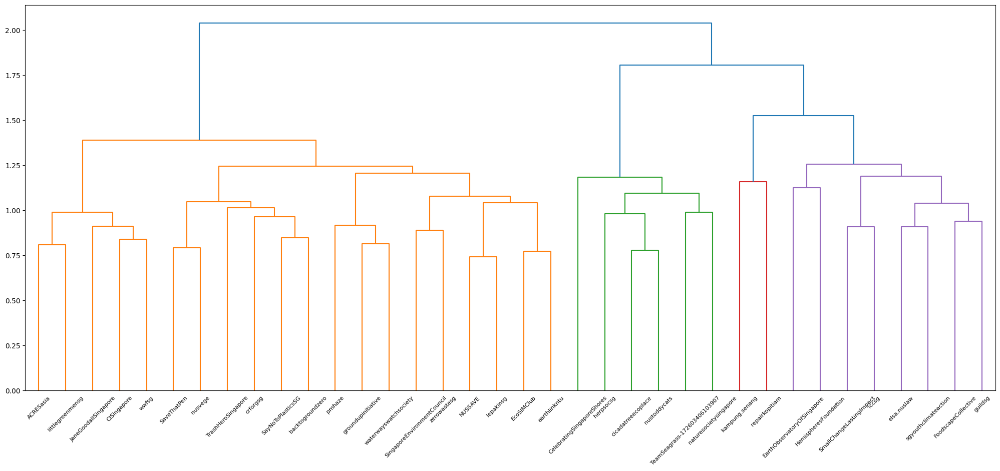

In [80]:
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist, squareform
distance_matrix = squareform(pdist(pivot_topics, metric='cosine'))
Z = linkage(distance_matrix, 'ward')
plt.figure(figsize=(25, 10))
dendrogram(Z, labels=pivot_topics.index)
plt.show()

In [ ]:
#singapore, malaysia, asean (club the other countries together) -> for intra country analysis

In [81]:
#check if a certain topic is prevelant in more than one organisation
def check_topic_prevalence(topic_data):
    topic_prevalence = topic_data.groupby('Topic')['Organisation'].nunique()
    return topic_prevalence

topic_prevalence = check_topic_prevalence(topic_dataset_filtered)
topic_prevalence

Topic
area             36
biodiversity     36
bird             36
call             36
coastal          36
code             36
conservation     36
corridor         36
ecologically     36
endangered       36
environmental    36
expansion        36
feature          36
forest           36
habitat          36
history          36
impact           36
important        36
insight          36
land             36
low              36
march            36
marsh            36
natural          36
network          36
north            36
perspective      36
plant            36
play             36
river            36
saturday         36
something        36
talk             36
threatened       36
tide             36
tool             36
tree             36
want             36
way              36
wildlife         36
world            36
Name: Organisation, dtype: int64

In [31]:
from pprint import pprint
pprint(total_topics)

[(0,
  [('beyondinstagram', 7.617886e-05),
   ('actionsinteractions', 7.617886e-05),
   ('emotionally', 7.617886e-05),
   ('discriminationwe', 7.617886e-05),
   ('complemented', 7.617886e-05),
   ('posting', 7.617886e-05),
   ('mismatchedmatches', 7.617886e-05),
   ('skip', 7.617886e-05),
   ('refrain', 7.617886e-05),
   ('vegetarianism', 7.617886e-05)]),
 (1,
  [('beyondinstagram', 7.617886e-05),
   ('actionsinteractions', 7.617886e-05),
   ('emotionally', 7.617886e-05),
   ('discriminationwe', 7.617886e-05),
   ('complemented', 7.617886e-05),
   ('posting', 7.617886e-05),
   ('mismatchedmatches', 7.617886e-05),
   ('skip', 7.617886e-05),
   ('refrain', 7.617886e-05),
   ('vegetarianism', 7.617886e-05)]),
 (2,
  [('beyondinstagram', 7.617886e-05),
   ('actionsinteractions', 7.617886e-05),
   ('emotionally', 7.617886e-05),
   ('discriminationwe', 7.617886e-05),
   ('complemented', 7.617886e-05),
   ('posting', 7.617886e-05),
   ('mismatchedmatches', 7.617886e-05),
   ('skip', 7.617886e

## Inter-Country Analysis of Organisations

In [32]:
#convert into a dictonary format
topics_and_terms = {}
for tuple_elems in total_topics:
  topics_and_terms[tuple_elems[0]] = tuple_elems[1]

#10 terms being selected per topic

#filter a topic based on the top term, if that term makes sense or not?
topics_and_top_terms = {}
max_prob = 0
top_term = ""
curr_topic = 0
for terms_per_topic in topics_and_terms.values():
  for word_and_prob in terms_per_topic:
    if (word_and_prob[1] > max_prob):
      top_term = word_and_prob[0]
      max_prob = word_and_prob[1]
  topics_and_top_terms[curr_topic] = top_term
  curr_topic += 1

In [33]:
#filter topics based on a threshold probability
threshold_prob = 0.03
selected_topics = []
topics_and_terms = lda_model_total.show_topics(formatted=False, num_topics=optimal_num_topics)
def filter(topics_words_prob):
  for topic_id, prob_words in topics_words_prob:
    avg_prob_topic = sum(prob for _, prob in prob_words) / len(prob_words)
    if(avg_prob_topic) > threshold_prob:
      selected_topics.append((topic_id, prob_words))

In [34]:
#get the optimal_topic_num amount of topics with the highest average probability
selected_topics = []
topic_keys = []
max_prob_topic = 0
top_id = 0
prob_word = ""
total_topics_copy = total_topics.copy()
for iteration in range(optimal_num_topics):
  for topic_id, prob_words in total_topics_copy:
    avg_prob_topic = sum(prob for _, prob in prob_words) / len(prob_words)
    if ((avg_prob_topic > max_prob_topic) and (topic_id, prob_words) in total_topics):
      top_id = topic_id
      prob_word = prob_words

  selected_topics.append((top_id, prob_word))
  topic_keys.append(top_id)
  total_topics.remove((top_id, prob_word))

print(selected_topics)
print(topic_keys)

[(13126, [('beyondinstagram', 7.617886e-05), ('actionsinteractions', 7.617886e-05), ('emotionally', 7.617886e-05), ('discriminationwe', 7.617886e-05), ('complemented', 7.617886e-05), ('posting', 7.617886e-05), ('mismatchedmatches', 7.617886e-05), ('skip', 7.617886e-05), ('refrain', 7.617886e-05), ('vegetarianism', 7.617886e-05)]), (13125, [('beyondinstagram', 7.617886e-05), ('actionsinteractions', 7.617886e-05), ('emotionally', 7.617886e-05), ('discriminationwe', 7.617886e-05), ('complemented', 7.617886e-05), ('posting', 7.617886e-05), ('mismatchedmatches', 7.617886e-05), ('skip', 7.617886e-05), ('refrain', 7.617886e-05), ('vegetarianism', 7.617886e-05)]), (13124, [('beyondinstagram', 7.617886e-05), ('actionsinteractions', 7.617886e-05), ('emotionally', 7.617886e-05), ('discriminationwe', 7.617886e-05), ('complemented', 7.617886e-05), ('posting', 7.617886e-05), ('mismatchedmatches', 7.617886e-05), ('skip', 7.617886e-05), ('refrain', 7.617886e-05), ('vegetarianism', 7.617886e-05)]), (13

In [41]:
len(topic_keys) #extracting 41 topics from each 

41